# 
#### 

### GRAD-E1426 Network Analysis: Assignment 2
#### Janine De Vera, 219848

# Characterizing the Depth and Scope of Trade Agreements

## I. Introduction

Over the last half century the world has seen historic changes in the international trade landscape, marked by increasing fragmentation of production processes through global value chains and deepening of trade relations through **preferential trade agreements (PTAs)**. Based on the World Trade Organization's (WTO) database, the number of trade agreements in force grew seven-fold from 50 in 1990 to 355 in 2022. 

The sharp rise in trade agreements sparked a new research interest in the depth and scope of their contents. Before the mid 1990s, PTAs mostly invovled provisions for market access and preferential tariffs. In the last 30 years new forms of cooperation have spread and trade agreements have become deeper, making room for provisions outside the scope of the WTO mandate, such as data protection, intellectual property, human rights, and environmental laws. 

This report provides a descriptive analysis of trade agreement networks. It focuses on characteritizing how the nature and scope of agreements have changed over time and identifying key actors that drive network dynamics. 

The github repository for this project can be found <a href="https://github.com/janinepdevera/network-analysis-trade-agreements">here</a>.

In [389]:
import graph_tool.all as gt
import graph_tool.stats as gt_stats
import matplotlib
import matplotlib.colors as colors
from matplotlib.font_manager import FontProperties
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
from matplotlib.pyplot import clf, xlabel, ylabel, imshow, colorbar, savefig
import pandas as pd
import numpy as np
from scipy import stats
import seaborn as sns
import os
import math

## II. Data

The main data for this analysis is derived from the <a href="https://datatopics.worldbank.org/dta/table.html">*Horizontal Trade Agreements Database*</a> compiled by the World Bank. This dataset contains preferential trade agreements (PTAs) notified to the World Trade Organization as of 2015. For each agreement the following variables are provided:
<ol> 
1. trade partners<br>
2. year of enforcement<br>
3. trade agreement type (CU, EIA, FTA)<br>
4. indicators of presence (or absence) of 52 PTA provisions<br>
5. legal enforceability of each provision<br>
</ol>

All information is recorded bilaterally. 

There are two main types of PTA provisions: _**wto-plus**_ and _**wto-x**_. The former includes provisions under the mandate of the WTO such as anti-dumping policies, customs duties and export taxes. The latter, _**wto-x**_ (WTO extra), pertains to provisions outside the mandate of the WTO such as consumer protection, environmental laws, cultural cooperation, and immigration policies. There 14 WTO-plus provisions and 38 WTO-X provisions in the database. More details on the policies and provisions can be found in this  <a href="https://documents1.worldbank.org/curated/en/700771487791538589/pdf/WPS7981.pdf">paper</a>.

From this dataset, measures of trade agreement depth can be calculated. The _**depth**_ variable quantifies the scope of a trade agreement by summing the number of key PTA provisions mentioned in a particular agreement. The maximum possible value is 52. Similarly, the _**depth_le**_ variable is a measure of depth and scope, but only considers legally enforceable provisions. 

In [426]:
pta = pd.read_excel("../data/WB_Bilateral PTAs.xlsx")

In [427]:
pta['depth'] = pta.filter(regex=r'^wto(?!.*_le$)').sum(axis=1)
pta['depth_le'] = pta.filter(regex=r'^wto_.*_le$').clip(lower=0, upper=1).abs().sum(axis=1)
pta.head()

,cty1,iso1,cty2,iso2,year,agreement,entry_force,type,wto_plus_ftaindustrial,wto_plus_ftaagriculture,...,wto_X_regionalcooperation_le,wto_X_researchandtechnology_le,wto_X_sme_le,wto_X_socialmatters_le,wto_X_statistics_le,wto_X_taxation_le,wto_X_terrorism_le,wto_X_visaandasylum_le,depth,depth_le
0,Angola,AGO,Burundi,BDI,1994,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,29,11
1,Angola,AGO,Burundi,BDI,1995,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,29,11
2,Angola,AGO,Burundi,BDI,1996,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,29,11
3,Angola,AGO,Burundi,BDI,1997,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,29,11
4,Angola,AGO,Burundi,BDI,1998,COMESA,1994,CU,1,1,...,0,0,0,0,0,0,0,0,29,11


The 52 PTA provisions in the dataset cover a wide range of cooperation areas. <a href="https://www.sciencedirect.com/science/article/abs/pii/S2214312216300138?via%3Dihub">Limao (2016)</a> categorises them into 9 groups - (i) import tariffs, (ii) non-tariff barriers, (iii) behind the border policies, (iv) other policies, (v) services, (vi) technology, (vii) investment/capital, (viii) labor, and (ix) non-economic policies.

For the exploratory analysis in later sections, I focus on agreements that contain legally binding commitments on **non-economic policies**. The provisions included in this category are environmental laws, audiovisual cooperation, cultural cooperation, health, human rights, illicit drugs, money laundering, political dialogue, and terrorism. To be able to use this information, I create an indicator variable for whether an agreement contains at least one legally enforceable non-economic policy. 

In [428]:
# indicator variable for wto_x_le
pta['wto_x_le'] = 0
for column in pta.columns:
    if "wto_X" in column and "_le" in column:
        pta['wto_x_le'] = pta['wto_x_le'] | (pta[column] > 0)
pta['wto_x_le'] = pta['wto_x_le'].astype(int)

# indicator variable for wto_x_nonecon
non_econ = ['wto_X_environmentallaws_le', 'wto_X_audiovisual_le', 'wto_X_culturalcooperation_le', 'wto_X_health_le', 'wto_X_humanrights_le', 
            'wto_X_illicitdrugs_le', 'wto_X_moneylaundering_le', 'wto_X_politicaldialogue_le', 'wto_X_terrorism_le', ]
pta['wto_x_nonecon'] = 0
for column in pta.columns:
    if column in non_econ:
        pta['wto_x_nonecon'] = pta['wto_x_nonecon'] | (pta[column] > 0)
pta['wto_x_nonecon'] = pta['wto_x_nonecon'].astype(int)

I also supplement the dataset with other country-level information such as broad geographic region, economy size, and income classification. These can be added as additional features of the network.

In [429]:
regions = pd.read_excel("../data/WB_regions.xls", skiprows=4, index_col=0)
regions = regions[['Economy', 'Code', 'Region_Clean', 'Income group']].dropna(subset = ['Region_Clean'])

In [430]:
economy = pd.read_excel("../data/WB_economy.xlsx")
economy = (economy
           .dropna(subset=['Series Code'])
           .iloc[:, [3, 13]]
           .rename(columns={economy.columns[13]: 'gdp'})) # 2019 GDP 

economy['log_gdp'] = np.log(economy['gdp'].replace('..', float('nan')).astype(float))
economy['log_gdp'] = economy['log_gdp'].fillna(economy['log_gdp'].min(skipna=True)) # fill NA values with minimum 

The final merged dataset _**trade_df**_ is constructed such that each observation is a unique country-pair agreement.

In [431]:
# merge datasets
trade_df = pd.merge(pta, regions, left_on='iso1', right_on='Code')
trade_df = pd.merge(trade_df, economy, left_on='iso1', right_on='Country Code')

In [432]:
# remove duplicate pairs
trade_df['sorted_iso'] = trade_df[['iso1', 'iso2']].apply(lambda x: tuple(sorted(x)), axis=1) # country-pair tuple
trade_df = trade_df.drop_duplicates(subset=['sorted_iso', 'agreement'], keep='first')

Below are some statistics to describe the trade agreements database. 

In [484]:
print('Number of countries: ' + str(len(pd.concat([trade_df['iso1'], trade_df['iso2']]).unique())))
print('Number of unique agreements: ' + str(len(trade_df['agreement'].unique())))
print('Number of unique pairs: ' + str(len(trade_df['sorted_iso'].unique())))
print('Years covered: ' + str(trade_df['entry_force'].min()) +  '-' + str(trade_df['entry_force'].max()))

Number of countries: 189
Number of unique agreements: 261
Number of unique pairs: 3141
Years covered: 1958-2015


In [434]:
trade_df[['depth', 'depth_le']].describe().applymap('{:,.0f}'.format)

,depth,depth_le
count,"6,351","6,351"
mean,27,24
std,11,12
min,1,0
25%,20,11
50%,33,28
75%,34,36
max,48,44


## III. Trade Agreements Networks

### A. Creating a *graph* object

To visualize the trade agreements network, the data has to be structured in a way that is compatible with the _**Graph()**_ class of graph-tool. I create a list of unique countries which will serve as nodes, and country-pair agreements which will serve as edges. The network is designed such that if two countries have more than one PTA with each other, there will also be more than one link between them. Country name and pair name properties for nodes and edges are also added for ease of reference. 

In [435]:
# unique countries and country pair agreements
nodes = trade_df['iso1'].drop_duplicates()
pairs = trade_df[['iso1', 'iso2', 'agreement']].drop_duplicates(keep='first')

# edge pairs as list of tuples 
pairs = list(zip(pairs.iso1, pairs.iso2))

In [436]:
# instantiate undirected Graph object
trade_graph = gt.Graph(directed=False)

In [437]:
# add nodes and edges from pairs list, create country_name and pair_name as properties
country_name = trade_graph.new_vertex_property('string')
pair_name = trade_graph.new_edge_property('object')

node_list = {}
for pair in pairs:
    for name in pair:
        if name not in node_list:
            v = trade_graph.add_vertex() #add vertex 
            node_list[name] = v #add vertex index to node dict
            country_name[v] = name #add name of vertex index as property
    e = trade_graph.add_edge(node_list[pair[0]], node_list[pair[1]]) #add edge
    pair_name[e] = (pair[0], pair[1]) #add name of pair index as property

trade_graph.vertex_properties["country_name"] = country_name
trade_graph.edge_properties["pair_name"] = pair_name

In [342]:
# network layout: position of nodes 
pos = gt.sfdp_layout(trade_graph)

The initial undirected and unweighted network is shown below.

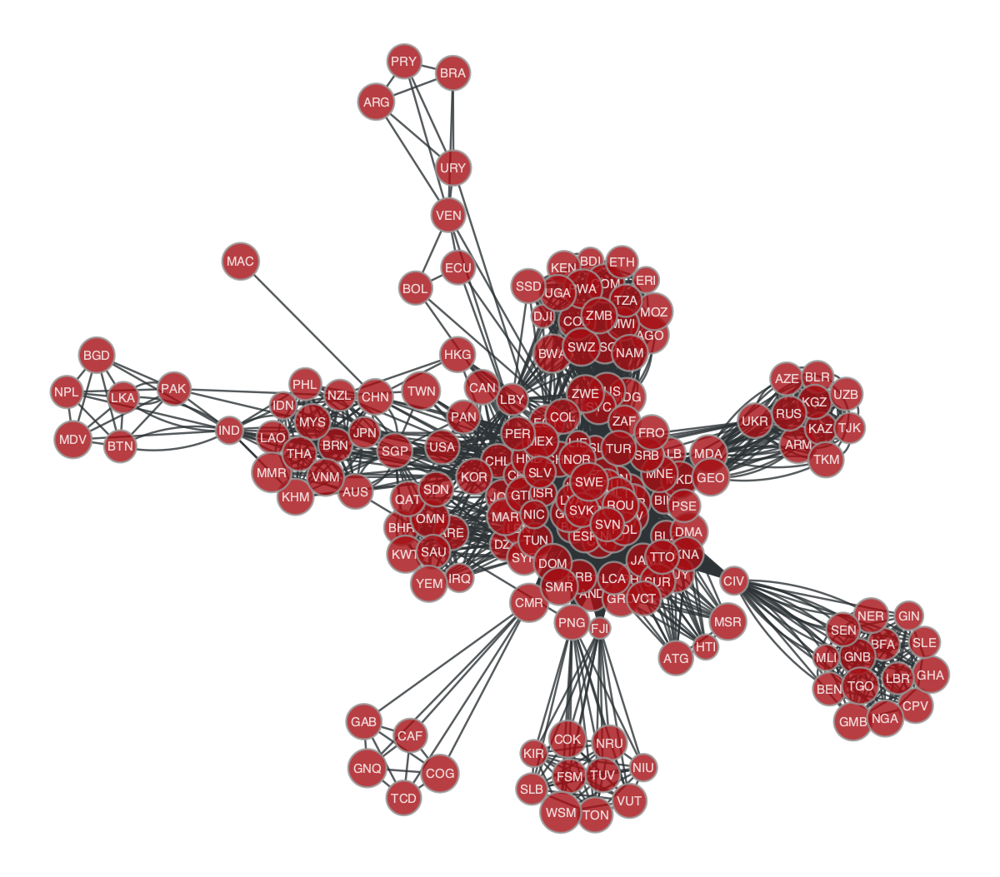

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28aef76d0, at 0x2835c0850>

In [438]:
gt.graph_draw(trade_graph, pos = pos, vertex_text = country_name, vertex_font_family='sans serif')

### B. Node and edge properties

Other country-level and agreement-level information can also be introduced to the Graph object as node and edge properties. These properties can be used to visualize more information in the network and create sub-networks.

* **Node color**: country's geographical region
* **Node size**: economy size (i.e. Gross Domestic Product, 2019)
* **Edge weight**: trade agreement depth 
* **Edge color**: whether an agreement contains non-economic provisions 
* **Edge filter**: year when agreement was enforced 


#### i. Nodes

In [439]:
def add_node_property(node_property_type, dictionary, default_val=0):
    node_property = trade_graph.new_vertex_property(node_property_type)

    for v in trade_graph.vertices():
        name = trade_graph.vp.country_name[v]
        if name in dictionary:
            node_property[v] = dictionary[name]
        else:
            node_property[v] = default_val 
            #trade_graph.remove_vertex(v)
    return node_property

*Node color: region*

In [440]:
# list of unique country names and corresponding region
country1 = trade_df[['iso1']]
country2 = trade_df[['iso2']].rename(columns={'iso2': 'iso1'})

countries_all = pd.concat([country1, country2], ignore_index = True).drop_duplicates(keep='first')
countries_all = pd.merge(countries_all, regions, left_on='iso1', right_on='Code')[['iso1', 'Region_Clean']]

In [441]:
# region-color dictionary  
region_colors = {'Sub-Saharan Africa':'#FA9265', # orange
                 'Europe': '#7ACCE1', # blue
                 'Middle East & North Africa': '#FA9265', # orange
                 'Latin America & Caribbean': '#90BC62', # green
                 'East Asia & Pacific': '#C7448C', # pink
                 'Central Asia': '#C7448C', # pink
                 'South Asia': '#C7448C', # pink
                 'North America': '#A68FC7'} # purple

# map colors to regions
countries_all['region_colors'] = countries_all['Region_Clean'].map(region_colors)

# node color dictionary
node_color_dict = (
    countries_all[['iso1', 'region_colors']]
    .drop_duplicates()
    .set_index('iso1')
    .to_dict()['region_colors']
    )

In [442]:
node_color = add_node_property('string', node_color_dict, default_val=None)
trade_graph.vertex_properties["node_color"] = node_color

*Node filter: region*

In [443]:
# node region dictionary
node_region_dict = (
    countries_all[['iso1', 'Region_Clean']]
    .drop_duplicates()
    .set_index('iso1')
    .to_dict()['Region_Clean']
    )

In [444]:
node_region = add_node_property('string', node_region_dict, default_val=None)
trade_graph.vertex_properties["node_region"] = node_region

*Node size: economy size*

In [445]:
# node size dictionary
node_size_dict = (
    trade_df[['iso1', 'log_gdp']]
    .drop_duplicates()
    .set_index('iso1')
    .to_dict()['log_gdp']
    )

In [446]:
node_size = add_node_property('float', node_size_dict)
trade_graph.vertex_properties["node_size"] = node_size

#### ii. Edges

In [447]:
def add_edge_property(edge_property_type, dictionary, default_val=0):
    edge_property = trade_graph.new_edge_property(edge_property_type)
    for e in trade_graph.edges():
        name = trade_graph.ep.pair_name[e]
        if name in dictionary:
            edge_property[e] = dictionary[name]
        else:
            edge_property[e] = default_val
    return edge_property

*Edge weight: depth of trade agreements*

In [448]:
# define edge weight dictionary
edge_size_dict = (
    trade_df[['sorted_iso', 'depth_le']]
    .drop_duplicates()
    .set_index('sorted_iso')
    .to_dict()['depth_le']
    )

In [449]:
# add edge property
edge_weight = add_edge_property(edge_property_type='float', dictionary=edge_size_dict, default_val=0)
trade_graph.edge_properties['edge_weight'] = edge_weight

*Edge color: legal enforceability of non-economic provisions*

In [450]:
# agreement-color dictionary  
wto_colors = {1:'#FAEABA', # yellow
              0: '#EBEBEB'} # white

# map colors to agreements
trade_df['wto_colors'] = trade_df['wto_x_nonecon'].map(wto_colors)

# define edge color dictionary
edge_colors_dict = (
    trade_df[['sorted_iso', 'wto_colors']]
    .drop_duplicates()
    .set_index('sorted_iso')
    #.apply(lambda x: {'wto_colors': x['wto_colors'], 'wto_x_nonecon': x['wto_x_nonecon']}, axis=1)
    .to_dict()['wto_colors']
    )

In [451]:
edge_color = add_edge_property(edge_property_type='string', dictionary=edge_colors_dict, default_val='#EBEBEB')
trade_graph.edge_properties['edge_color'] = edge_color

*Edge filter: legal enforceability of non-economic provisions*

In [452]:
# define edge color dictionary
edge_nonecon_dict = (
    trade_df[['sorted_iso', 'wto_x_nonecon']]
    .drop_duplicates()
    .set_index('sorted_iso')
    .to_dict()['wto_x_nonecon']
    )

In [453]:
edge_nonecon_prov = add_edge_property(edge_property_type='float', dictionary=edge_nonecon_dict, default_val=0)
trade_graph.edge_properties['edge_nonecon_prov'] = edge_nonecon_prov

*Edge filter: year agreement entry in force*

In [454]:
# define year dictionary
edge_year_dict = (
    trade_df[['sorted_iso', 'entry_force']]
    .drop_duplicates()
    .set_index('sorted_iso')
    .to_dict()['entry_force']
    )

In [455]:
edge_year= add_edge_property(edge_property_type='int', dictionary=edge_year_dict, default_val=0)
trade_graph.edge_properties['edge_year'] = edge_year

In [456]:
print(trade_graph.list_properties())

country_name          (vertex)  (type: string)
node_color            (vertex)  (type: string)
node_region           (vertex)  (type: string)
node_size             (vertex)  (type: double)
edge_color            (edge)    (type: string)
edge_nonecon_prov     (edge)    (type: double)
edge_weight           (edge)    (type: double)
edge_year             (edge)    (type: int32_t)
pair_name             (edge)    (type: python::object)
None


### C. Plot network

Below is the network of preferential trade agreements notified to the WTO from 1958-2015. Countries are represented as nodes - colors correspond to their regions and sizes are proportional to GDP. Nodes are linked together if two countries are signatories of the same trade agreement, regardless of whether the agreement is bilateral or multilateral. The edges are weighted by the depth of the agreement and are highlighted when the agreement involves provisions that are non-economic in nature (i.e. environmental, cultural, politcal, etc).

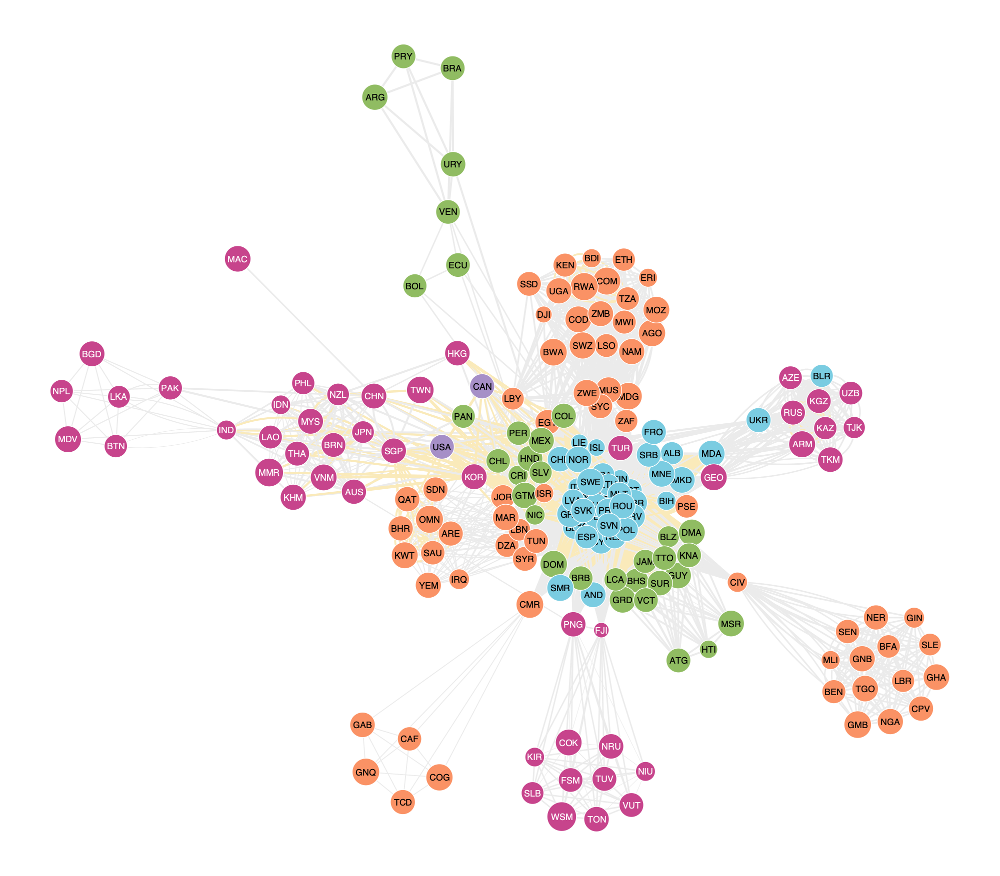

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28aef76d0, at 0x28aef7430>

In [457]:
gt.graph_draw(trade_graph, pos=pos, 
    vertex_fill_color=node_color,
    vertex_size=gt.prop_to_size(node_size, mi=5, ma=17), #size difference more visible without vertex text
    vertex_color='#FFFFFF',
    vertex_pen_width=0.7,
    vertex_anchor=0,
    vertex_font_family='sans serif',
    vertex_text=country_name,
    edge_color=edge_color,
    edge_pen_width=gt.prop_to_size(edge_weight, mi=0.5, ma=3),
    output_size=(1000,1000))
    #output="../charts/trade_complete.png")

As expected, the graph shows a clustering of nodes by region, indicating that economies which are geographically close tend to be involved in the same agreements. 

European countries, particularly EU members, appear to be the most dense and central set of nodes. The group is surrounded by and closely linked to Latin American countries. Collectively, the countries forming the Community of Latin American and Caribbean States (CELAC) is the EU's fifth largest trading partner <a href="https://www.europarl.europa.eu/RegData/etudes/IDAN/2019/644219/EPRS_IDA(2019)644219_EN.pdf">(European Parliament, 2019)</a>. The EU has both multiparty and bilateral agreements with most Latin American groupings and their individual members (e.g. CARIFORUM, Central American Group). A notable exception is the prominent trade bloc MERCOSUR (Argentina, Brazil, Paraguay, and Uruguay) which is isolated from Europe and other Latin American economies.

Within Asia, clusters are formed by ASEAN countries, Pacific nations, and former Soviet economies. Meanwhile, Middle East and Africa form 3 separate groups - South Africa, Central Africa, East Africa and Middle East. NAFTA members USA and Canada are close to the center with connections to Asian and Latin American countries. 

Based on the edges, majority of trade agreements do not contain provisions on non-economic policies. The ones that do are close to the center - the EU cluster, EU agreements with Latin American economies, and some agreements in South East Asia and Middle East. In terms of edge size and depth, the shallowest agreements appear to be mostly in the periphery, like the agreements among Central African countries, South Asian countries, and Pacific countries. 

In [645]:
print('Number of nodes: ' + str(trade_graph.num_vertices()))
print('Number of edges: ' + str(trade_graph.num_edges()))
print('Number of unique agreements: ' + str(len(trade_df['agreement'].unique())))
print('Mean depth: ' + str(round(trade_df['depth_le'].mean())))
print('Median depth: ' + str(round(trade_df['depth_le'].median())))

Number of nodes: 189
Number of edges: 6351
Number of unique agreements: 261
Mean depth: 24
Median depth: 28


In [539]:
trade_graph.save("../data/trade_networks.graphml") # save graph object to data folder

## IV. Sub Graphs

To examine how the network differs across time and different groups, I prune the original network to create subgraphs that satisfy given edge filters. 

In [458]:
def create_subgraph(main_graph, filter, largest=False):
    sub = gt.GraphView(main_graph, efilt=filter)

    if largest: # if true get largest connected component only 
        sub = gt.extract_largest_component(sub, prune=True)
    else:
        sub = gt.Graph(sub, prune=True)
        isolated_vertices = [v for v in sub.vertices() if sub.vertex(v).out_degree() == 0 and sub.vertex(v).in_degree() == 0]
        sub.remove_vertex(isolated_vertices, fast=True)

    return sub

### A. By year

I create two sub-networks based on when a certain agreement came into force - before and after 2000. Literature on trade agreements highlight key differences in PTAs formed within these two periods. Earlier agreements focused on facilitating trade openness and economic integration primarily through tariffs. As these objectives were achieved and solidified, modern PTAs increased in depth and breadth and moved towards non-tariff regulations (e.g. service provisions, labor market regulations) and non-economic policy areas. 

Aside from differences in scope, another distinction between trade agreements in these two periods is the heterogeneity of actors invovled. In the 1950s and 60s PTAs emphasized *regionalism*, with the broadening of the European Economic Community (EEC) at its center. Europe's push for continental integration encouraged other countries to follow suit. Regional and subregional unions also developed in Africa, South America, and Asia (e.g. MERCOSUR, COMESA, EAC, SADC, ASEAN). On the other hand, the more recent wave of agreements includes a wider network of participants. Cross-regional PTAs were initiated, encompassing countries in different regions and different levels of economic development.

#### i. Trade agreements before 2000

The graph below illustrates how trade agreements before the year 2000 focused on regional integration. Instead of one connected component, there are several small networks which consist of countries from the same subregions. In terms of depth and scope, non-economic cooperation areas are uncommon and the median depth of agreements is on the low end. 50% of agreements have less than 12 out of 52 (23%) legally enforceable provisions.

In [459]:
year_filter = trade_graph.new_edge_property("bool")
year_filter.a = trade_graph.ep.edge_year.a < 2000

sg_yr1 = create_subgraph(trade_graph, year_filter)

In [460]:
pos_yr = gt.sfdp_layout(sg_yr1) # network layout 

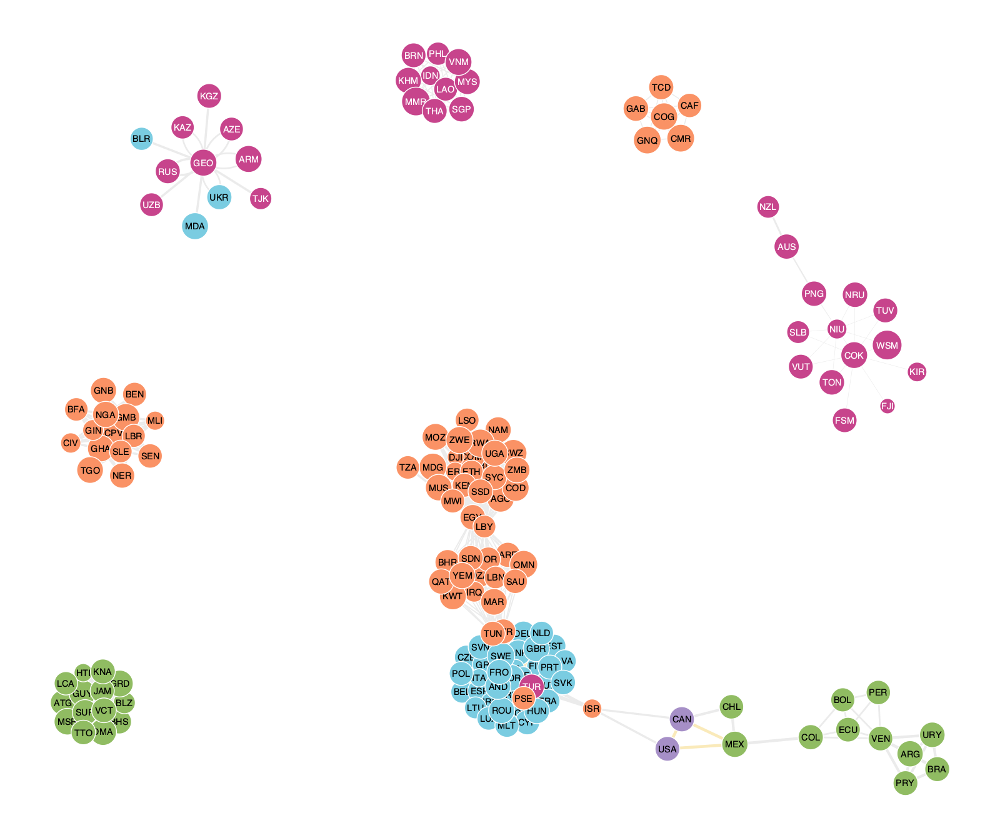

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x2800808e0, at 0x284301520>

In [461]:
gt.graph_draw(sg_yr1, pos=pos_yr,
            vertex_fill_color=sg_yr1.vp.node_color, 
            vertex_size=12, 
            vertex_text=sg_yr1.vp.country_name, 
            vertex_font_family='sans serif',
            vertex_anchor=0,
            vertex_color='#FFFFFF',
            vertex_pen_width=0.7,
            edge_pen_width=gt.prop_to_size(sg_yr1.ep.edge_weight, mi=0.3, ma=3),
            edge_color=sg_yr1.ep.edge_color,
            output_size=(800,800))

In [462]:
year1 = trade_df.loc[trade_df['year'] < 2000]
print('Number of nodes: ' + str(sg_yr1.num_vertices()))
print('Number of edges: ' + str(sg_yr1.num_edges()))
print('Number of unique agreements: ' + str(len(year1['agreement'].unique())))
print('Mean depth: ' + str(round(year1['depth_le'].mean())))
print('Median depth: ' + str(round(year1['depth_le'].median())))

Number of nodes: 159
Number of edges: 1204
Number of unique agreements: 71
Mean depth: 19
Median depth: 12


A formal way of measuring how dense network connections are is through *clustering coefficients*. Local clustering coeffiecients measure the proportion of a node's neighbors that are connected with each other, while global clustering coefficients measure the average local clustering across nodes. 

The network before 2000 is a moderately connected graph with a global clustering coefficient of 0.21. This means that for a randomly chosen node, an average of 21% of its neighbors are connected. In the context of trade agreements, this indicates that there are well-connected countries with relatively disconnected neighbors. An example is Georgia - it has multiple bilateral agreements with Central Asian countries that do not have any cooperation initiatives with each other or with economies outside the region.

In [646]:
print('Global clustering coefficient: ' + str(gt.global_clustering(sg_yr1, weight=sg_yr1.ep.edge_weight)[0]))

Global clustering coefficient: 0.2136022550284848


#### ii. Trade agreements after 2000

The agreements network after 2000 has denser edges, indicating an increase in multilateral initiatives across different regions. While the number of countries invovled is almost the same as before 2000, there are five times as much bilateral partnerships and more than twice as much unique agreements. The median depth of PTAs are also higher and agreements containing non-economic provisions are more common. The global clustering coefficient is also significantly higher in this period. This shows well-developed ties among economies and economic groups, with very few isolated countries.

In [464]:
year_filter = trade_graph.new_edge_property("bool")
year_filter.a = trade_graph.ep.edge_year.a >= 2000

sg_yr2 = create_subgraph(trade_graph, year_filter, largest=True)

In [467]:
pos_yr2 = gt.sfdp_layout(sg_yr2)

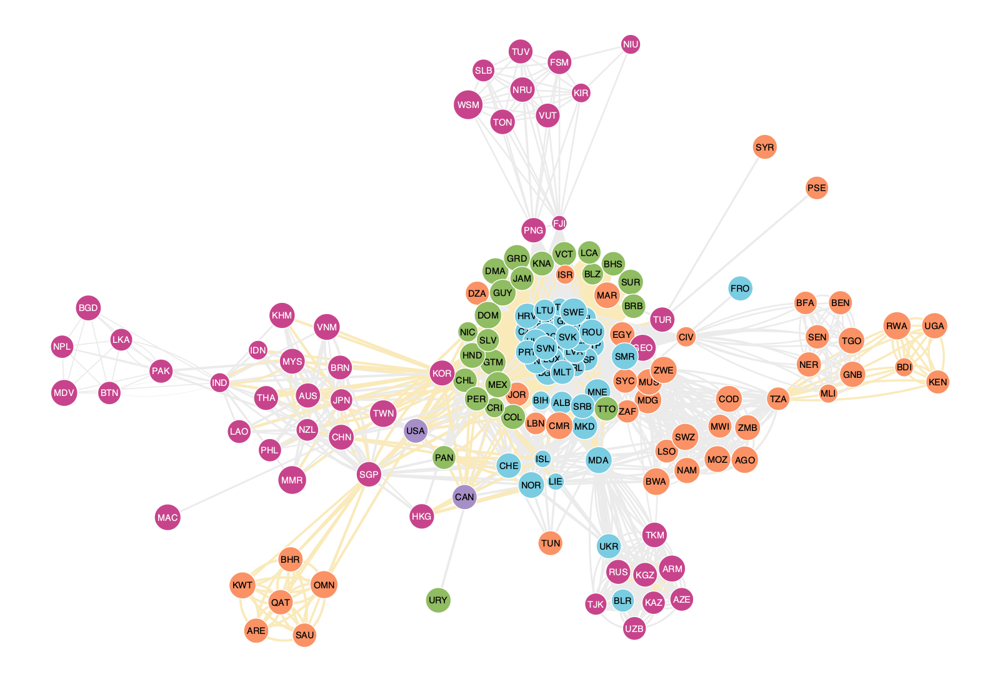

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28432bc10, at 0x29aa54970>

In [468]:
gt.graph_draw(sg_yr2, pos=pos_yr2,
            vertex_fill_color=sg_yr2.vp.node_color, 
            vertex_size=12, 
            vertex_text=sg_yr2.vp.country_name, 
            vertex_font_family='sans serif',
            vertex_anchor=0,
            vertex_color='#FFFFFF',
            vertex_pen_width=0.7,
            edge_pen_width=gt.prop_to_size(sg_yr2.ep.edge_weight, mi=0.3, ma=3),
            edge_color=sg_yr2.ep.edge_color,
            output_size=(800,800))

In [469]:
year2 = trade_df.loc[trade_df['entry_force'] >= 2000]
print('Number of nodes: ' + str(sg_yr2.num_vertices()))
print('Number of edges: ' + str(sg_yr2.num_edges()))
print('Number of unique agreements: ' + str(len(year2['agreement'].unique())))
print('Mean depth: ' + str(round(year2['depth_le'].mean())))
print('Median depth: ' + str(round(year2['depth_le'].median())))

Number of nodes: 157
Number of edges: 5147
Number of unique agreements: 190
Mean depth: 22
Median depth: 20


In [470]:
print('Global clustering coefficient: ' + str(gt.global_clustering(sg_yr2, weight=sg_yr2.ep.edge_weight)[0]))

Global clustering coefficient: 0.9402187704513677


### B. By scope

I also create a subgraph of agreements which contain legally binding provisions on non-economic issues such as terrorism and environment protection. While there are significantly less countries involved in this network, their PTAs are deeper on average. Half of agreements have a depth of more than 35 out of 52 (67%). This network has one main component and two smaller ones - the largest component includes European, Latin American, Southeast Asian, and Middle Eastern countries, while the smaller groups are between Central Asian countries and East African economies.

In [637]:
scope_filter = trade_graph.new_edge_property("bool")
scope_filter.a = trade_graph.ep.edge_nonecon_prov.a == 1

sg_nonecon = create_subgraph(trade_graph, scope_filter)

In [638]:
pos_scope = gt.sfdp_layout(sg_nonecon)

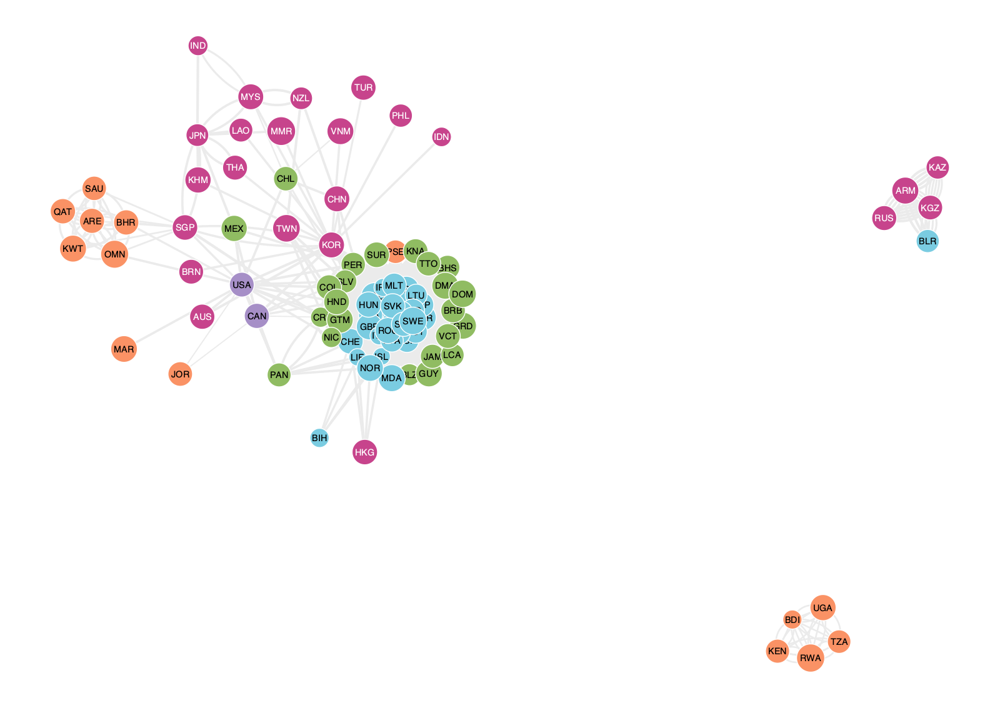

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28a4928e0, at 0x28a80c160>

In [640]:
gt.graph_draw(sg_nonecon, pos=pos_scope,
            vertex_fill_color=sg_nonecon.vp.node_color, 
            vertex_size=12, 
            vertex_text=sg_nonecon.vp.country_name, 
            vertex_font_family='sans serif',
            vertex_anchor=0,
            vertex_color='#FFFFFF',
            vertex_pen_width=0.7,
            edge_pen_width=gt.prop_to_size(sg_nonecon.ep.edge_weight, mi=0.3, ma=3),
            edge_color='#EBEBEB',
            output_size=(800,800))

In [642]:
nonecon = trade_df.loc[trade_df['wto_x_nonecon'] == 1]
print('Number of nodes: ' + str(sg_nonecon.num_vertices()))
print('Number of edges: ' + str(sg_nonecon.num_edges()))
print('Number of unique agreements: ' + str(len(nonecon['agreement'].unique())))
print('Mean depth: ' + str(round(nonecon['depth_le'].mean())))
print('Median depth: ' + str(round(nonecon['depth_le'].median())))

Number of nodes: 97
Number of edges: 4170
Number of unique agreements: 67
Mean depth: 32
Median depth: 35


## V. Descriptive Analysis

### A. Degree 

A common descriptive measure in network analysis is node **degree** (i.e. how many direct connections a node has). In the trade agreements network, the degree measures the number of agreements a country has with its neighbors. If a country belongs to a multiparty agreement (e.g. ASEAN), each bilateral partnership (e.g. Singapore-Philippines, Singapore-Malaysia, Singapore-Thailand) is counted as one connection.

#### i. Degree distributions

_**Probability distribution**_

I first compare the (probability) degree distribution of the trade network with an Erdos-Renyi or random network. The Erdos-Renyi graph is created by connecting 1000 vertices with edge probabilities drawn from a poission distribution with lambda = 50. The plot below shows that the connections in the trade network are different from what is expected by chance.

In [471]:
# create random network 
degrees = np.random.poisson(50, size=1000)
random_graph = gt.Graph(directed=False)
random_graph.add_vertex(len(degrees))
random_graph.add_edge_list(np.column_stack((np.arange(len(degrees)), degrees)), hashed=True)

<VertexPropertyMap object with value type 'int64_t', for Graph 0x284307220, at 0x17f79b040>

In [472]:
# degree distribution of random network
random_dist = gt.vertex_hist(random_graph, "total")

In [473]:
# degree distribution of trade network
trade_dist = gt.vertex_hist(trade_graph, "total")

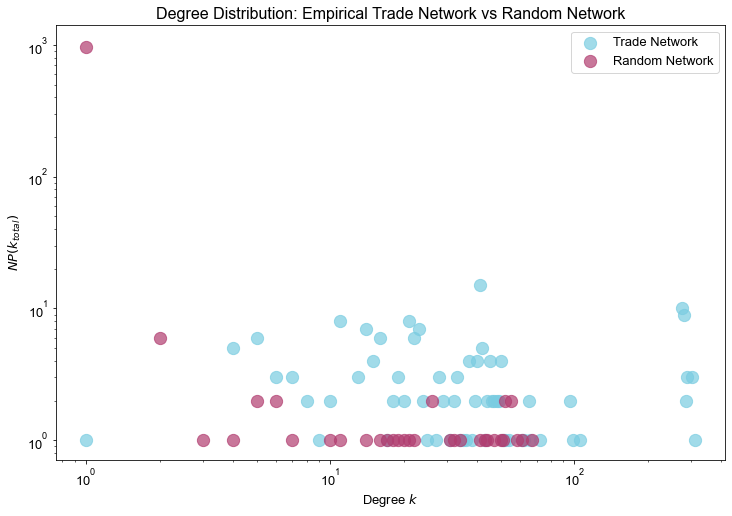

In [474]:
y = trade_dist[0]

plt.figure(figsize=(12, 8))
plt.scatter(trade_dist[1][:-1], trade_dist[0], color='#7ACCE1', s=150, alpha=0.7, label='Trade Network')
plt.scatter(random_dist[1][:-1], random_dist[0], color='#B13D70', s=150, alpha=0.7, label='Random Network')
plt.yscale("log")
plt.xscale("log")
plt.xlabel("Degree $k$", fontname='Arial', size=13)
plt.ylabel("$NP(k_{total})$", fontname='Arial', size=13)
plt.title('Degree Distribution: Empirical Trade Network vs Random Network', fontname='Arial', fontsize=16)
plt.xticks(fontname='Arial', fontsize=13)
plt.yticks(fontname='Arial', fontsize=13)
legend = plt.legend(loc='upper right', prop={'family': 'Arial', 'size': 13})

plt.show()

_**Frequency distribution**_

I also look at the frequency distribution of degrees in the trade network. The histogram below shows that majority of countries have between 1 to 50 bilateral partnerships, but there is also a set of nodes with more than 250 connections. 

In [475]:
degree_array = trade_graph.degree_property_map("total").a

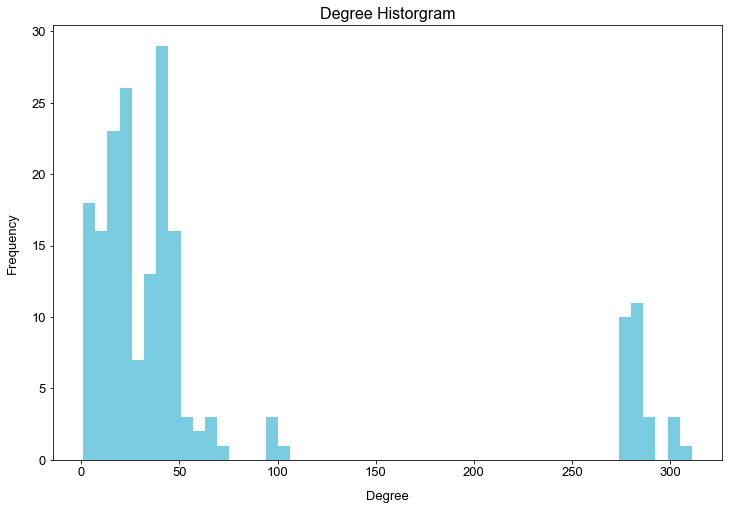

In [476]:
plt.figure(figsize=(12, 8))
plt.hist(degree_array, bins=50, color = "#7ACCE1")
plt.xlabel('Degree', labelpad=12, fontname='Arial', fontsize=13)
plt.ylabel('Frequency', labelpad=12, fontname='Arial', fontsize=13)
plt.title('Degree Historgram', fontname='Arial', fontsize=16)
plt.xticks(fontname='Arial', fontsize=13)
plt.yticks(fontname='Arial', fontsize=13)

plt.show()

#### ii. Top 20 countries by degree

The economy with the most number of connections is the EU (average degree of all EU countries). It is followed by four other European economies, Iceland, Switzerland, Liechtenstein, and Norway, which are not part of the European Union but have existing agreements with the bloc. The four countries form the European Free Trade Association (EFTA) and are part of the European Economic Area (EEA). 

Half of the most connected countries are in Africa and Middle East, while there are two from Asia (South Korea and Turkey) and two from Latin America (Chile and Costa Rica).

In [477]:
# create dataframe of country, region, node degree
country_name_list = [trade_graph.vp.country_name[v] for v in trade_graph.vertices()]
region_name_list = [trade_graph.vp.node_region[v] for v in trade_graph.vertices()]

degree_df = pd.DataFrame({"country_name": country_name_list, "region": region_name_list, "degree": degree_array})

In [478]:
# group EU as one economy
df_europe = degree_df[degree_df['region'] == 'Europe']

noneu = ['ALB', 'AND', 'BLR', 'BIH', 'ISL', 'LIE', 'MDA', 'MNE', 'NOR', 'SRB', 'CHE']
df_europe = df_europe[~df_europe['country_name'].isin(noneu)]
df_eu = pd.DataFrame({"country_name": ['EU'], "region": ['Europe'], "degree": [df_europe['degree'].mean()]}) #ave degree of EU countries

degree_df = pd.concat([degree_df, df_eu], ignore_index=True)
degree_df = degree_df[~degree_df['country_name'].isin(df_europe['country_name'])]

In [302]:
degree_df.sort_values(by='degree', ascending=True, inplace=True)
top_20_countries = degree_df.tail(20).reset_index(drop=True)

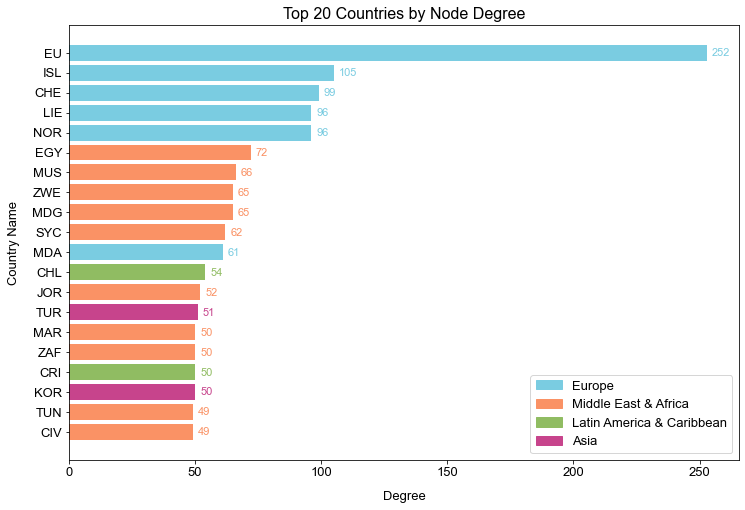

In [479]:
plot_colors = top_20_countries['region'].map(region_colors)

plt.figure(figsize=(12, 8))
plt.barh(top_20_countries['country_name'], top_20_countries['degree'], color = plot_colors)
plt.xlabel('Degree', labelpad=12, fontname='Arial', fontsize=13)
plt.ylabel('Country Name', labelpad=12, fontname='Arial', fontsize=13)
plt.title('Top 20 Countries by Node Degree', fontname='Arial', fontsize=16)
plt.xticks(fontname='Arial', fontsize=13)
plt.yticks(fontname='Arial', fontsize=13)

for i, degree in enumerate(top_20_countries['degree']):
    plt.text(degree + 2, i, str(int(degree)), ha='left', va='center', 
             color=plot_colors[i], fontname='Arial',fontsize=11)

legend_colors = {'Europe': '#7ACCE1', 'Middle East & Africa': '#FA9265', 
                 'Latin America & Caribbean': '#90BC62', 'Asia': '#C7448C'}

legend_patches = [mpatches.Patch(color=color, label=region) for color, region in zip(legend_colors.values(), legend_colors.keys())]
legend = plt.legend(handles=legend_patches, loc='lower right', prop={'family': 'Arial', 'size': 13})

plt.show()

#### iii. Degree and depth correlation

One interesting relationship to look at is the correlation between the degree of a node and its average depth. The plot below shows a positive correlation between node degree and average depth, an indication that well-connected countries are also more likely to sign deep trade agreements. 

In [480]:
depth_country = trade_df.groupby('iso1')['depth_le'].mean()
depth_country_df = pd.DataFrame({'country_name': depth_country.index,
                                 'ave_depth_le': depth_country.values})

degree_df = degree_df.merge(depth_country_df, on='country_name')

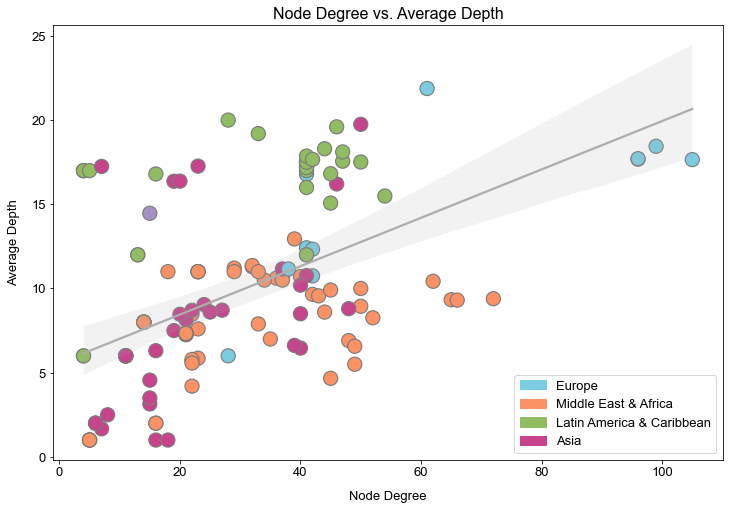

In [481]:
plot_colors = degree_df['region'].map(region_colors)

plt.figure(figsize=(12, 8))
sns.scatterplot(x='degree', y='ave_depth_le', data=degree_df, color=plot_colors, s=200, edgecolor='#7A7A7A')
sns.regplot(x='degree', y='ave_depth_le', data=degree_df, scatter=False, color='#ADADAD', robust=True)
plt.xlabel('Node Degree', labelpad=12, fontname='Arial', fontsize=13)
plt.ylabel('Average Depth', labelpad=12, fontname='Arial', fontsize=13)
plt.title('Node Degree vs. Average Depth', fontname='Arial', fontsize=16)
plt.xticks(fontname='Arial', fontsize=13)
plt.yticks(fontname='Arial', fontsize=13)

legend_colors = {'Europe': '#7ACCE1', 'Middle East & Africa': '#FA9265', 
                 'Latin America & Caribbean': '#90BC62', 'Asia': '#C7448C'}

legend_patches = [mpatches.Patch(color=color, label=region) for color, region in zip(legend_colors.values(), legend_colors.keys())]
legend = plt.legend(handles=legend_patches, loc='lower right', prop={'family': 'Arial', 'size': 13})

plt.show()


### B. Centrality 

In this section, centrality measures are applied to the full trade network and subnetworks. Measures of centrality describe how prominent a particular node is. In the agreements network, a central node is indicative of influence and visibility in international trade relations. 

In [482]:
color_map = colors.LinearSegmentedColormap.from_list('color_map', ['#FFFFC9', '#EA683A','#E35934', '#D53C2A', '#C71F1F'])

#### i. Full network

_**Eigenvector centrality**_

The eigenvector centrality is a measure of how important one's neighbors are. That is, a node's centrality is calculated as a function of its neighbors' centralities. In the trade agreements network, countries with high eigenvector centralities are linked to nodes that have a lot of well-connected neighbors.

As expected, the most central group of countries are those that make up the European Union. After World War II, European politicians began the process of building what is now one of the strongest economic and political unions in the world. Nodes in this neighborhood are all connected to each other through agreements that preceed the European Union (e.g. European Coal and Steel Community, European Economic Comminty), tangential European agreements (e.g. EFTA, EEA), and subsequent EU enlargements.

It follows that economies which share agreements with EU have higher eigenvector centralities compared to those that do not. After the EU core, the four European countries forming EFTA have the highest centrality scores, followed by Moldova and the Latin American countries surrounding EU. 


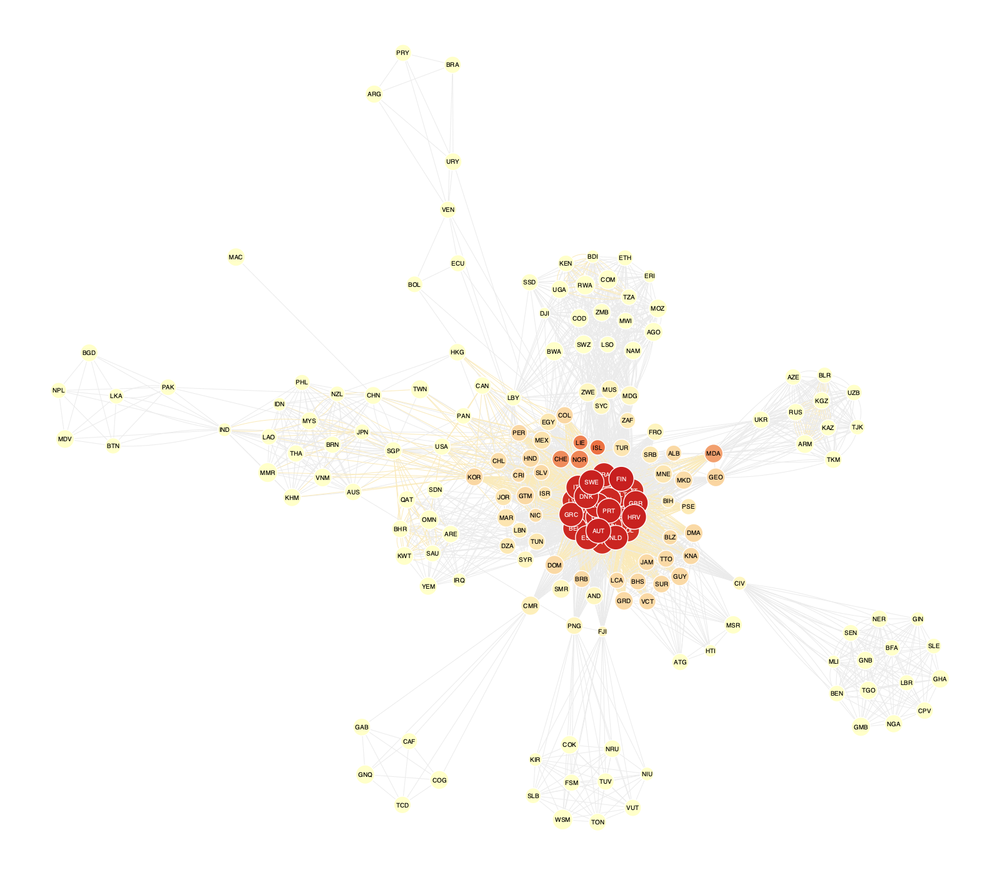

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28aef76d0, at 0x28bffe460>

In [488]:
ee, x = gt.eigenvector(trade_graph, weight=trade_graph.ep.edge_weight)

# network based on centrality
gt.graph_draw(trade_graph, pos=pos, 
              vertex_fill_color=x,
              vertex_size=gt.prop_to_size(x, mi=5, ma=20),
              vcmap=color_map,
              vertex_text=country_name, 
              vertex_font_family='sans serif',
              vertex_color='#FFFFFF',
              vertex_pen_width=0.7,
              edge_pen_width=0.5,
              edge_color=edge_color,
              vorder=x,
              output_size=(800,800))


_**Betweenness centrality**_

Another centrality measure relevant to the trade agreements network is **betweenness**. The betweenness centrality measures how often a node lies on the shortest path between other nodes. This allows us to identify certain nodes that serve as "brdiges" between other nodes and communities. In the trade agreements network, betweenness detects countries that may not be highly connected to their neighbors but are well-connected to other communities. These countries can therefore facilitate communication and coordination between different clusters. 

The key actors identified by betweenness centrality are different from those indentified by the eigenvector measure. The most central nations here are Singapore, which serves as South East Asia's bridge to Western economies, Jordan and Syria for Middle East, Cote D'ivoire for West Africa, and Georgia for Central Asia.

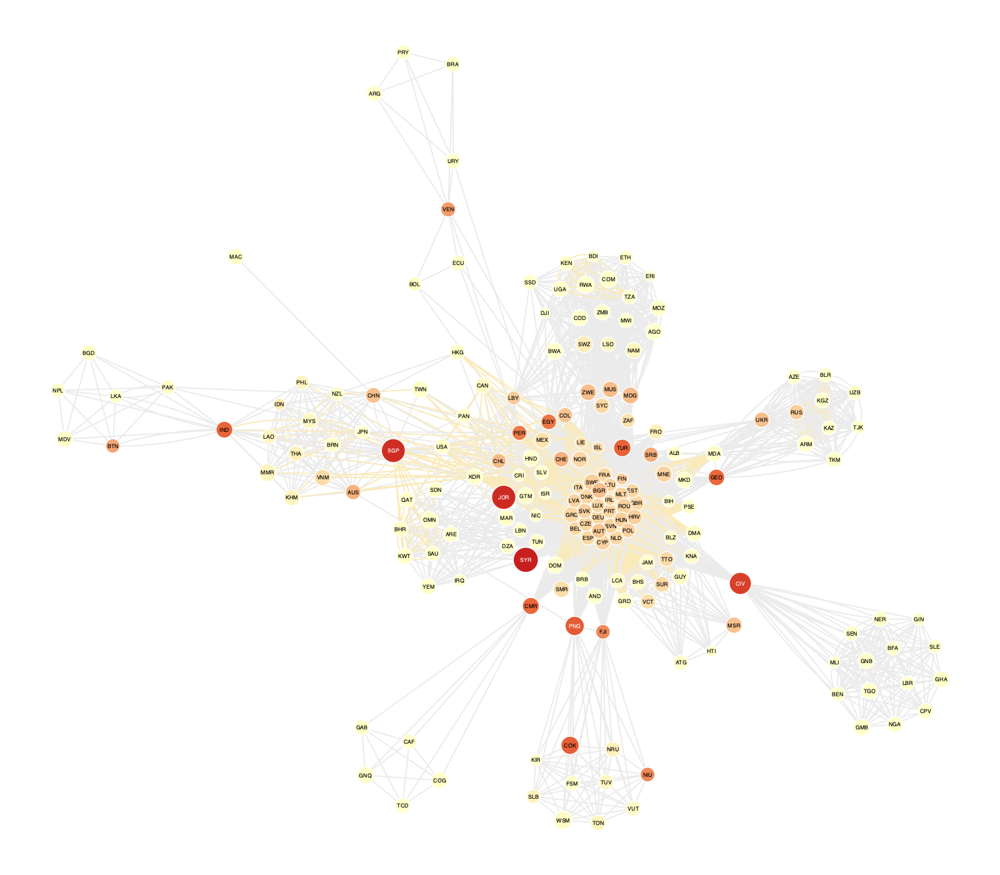

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28aef76d0, at 0x28b916fa0>

In [487]:
vp, ep = gt.betweenness(trade_graph, weight=trade_graph.ep.edge_weight)
gt.graph_draw(trade_graph, pos=pos, vertex_fill_color=vp,
              vertex_size=gt.prop_to_size(vp, mi=5, ma=20),
              #edge_pen_width=gt.prop_to_size(ep, mi=0.5, ma=5),
              edge_color=edge_color,
              vcmap=color_map,
              vertex_text=country_name, 
              vertex_font_family='sans serif',
              vertex_color='#FFFFFF',
              vertex_pen_width=0.7,
              vorder=vp,
              output_size=(800,800))

#### iii. Agreements before 2000

It is also interesting to look at the centrality measures of the different sub-networks created in section IV to examine whether the key actors have changed over the years. This subsection presents the eigenvector and betweenness centrality results for 3 subgraphs - the network before 2000, network after 2000, and network of agreements with non-economic provisions.

_**Eigenvector centrality**_

For the sub-network of trade agreements formed before 2000, key economies based on the eigenvector measure are still those in the EU, with Croatia being the most central economy.

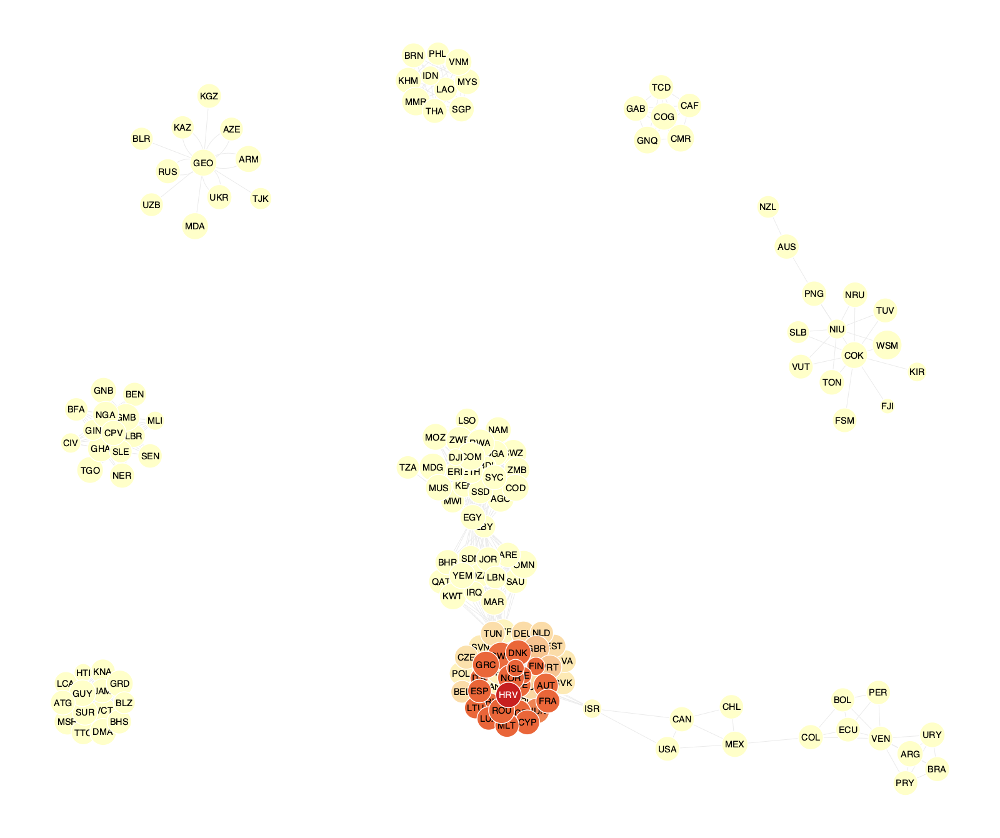

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x2800808e0, at 0x29a42d1f0>

In [627]:
ee, x = gt.eigenvector(sg_yr1, weight=sg_yr1.ep.edge_weight)

# network based on centrality
gt.graph_draw(sg_yr1, pos=pos_yr, 
              vertex_fill_color=x,
              vertex_size=12,
              vcmap=color_map,
              vertex_text=sg_yr1.vp.country_name,  
              vertex_font_family='sans serif',
              vertex_color='#FFFFFF',
              vertex_pen_width=0.7,
              edge_pen_width=0.5,
              edge_color='#EBEBEB',
              vorder=x,
              output_size=(800,800))

_**Betweenness centrality**_

Based on betweenness, the most central economies appear to be Syria, Morocco, and Egypt. The first two serve as a bridge between EU and the Middle East, while the latter connects the Middle East with East Africa. Other important economies are Israel which connects Europe to NAFTA members, Venezuela which connects MERCOSUR with the Andean Community, and Colombia which connects Latin American economies to North America. 

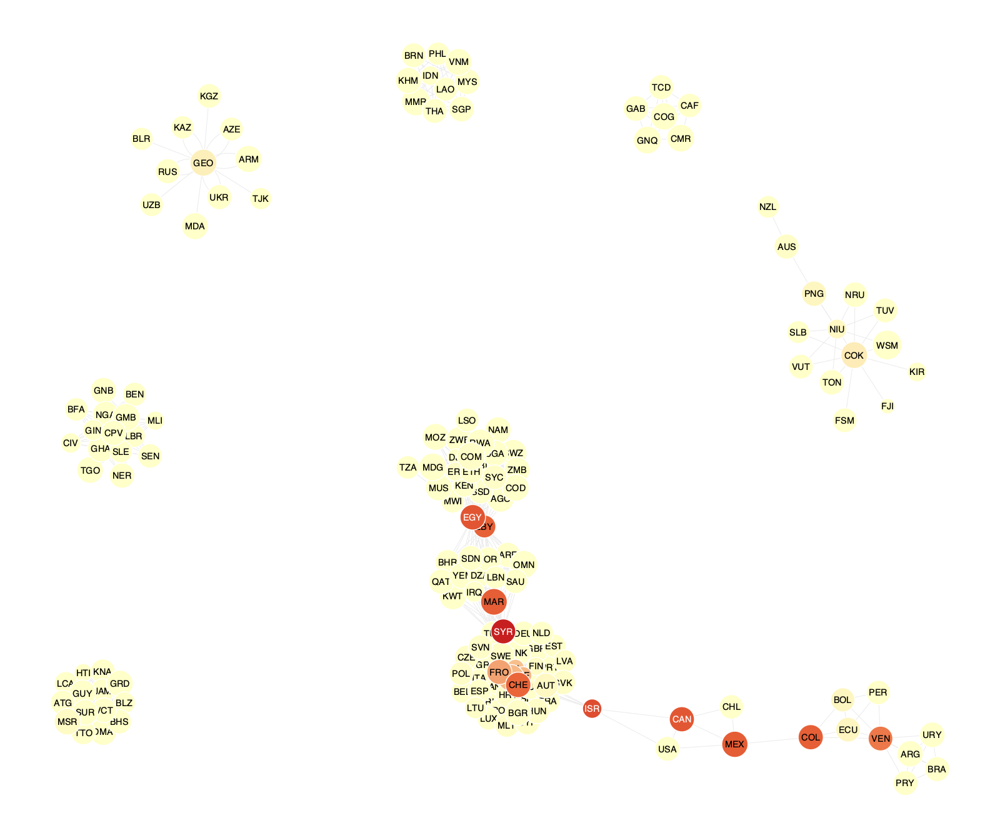

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x2800808e0, at 0x29db19790>

In [628]:
vp, ep = gt.betweenness(sg_yr1, weight=sg_yr1.ep.edge_weight)
gt.graph_draw(sg_yr1, pos=pos_yr, vertex_fill_color=vp,
              vertex_size=12,
              #edge_pen_width=gt.prop_to_size(ep, mi=0.5, ma=5),
              edge_color='#EBEBEB',
              vcmap=color_map,
              vertex_text=sg_yr1.vp.country_name, 
              vertex_font_family='sans serif',
              vertex_color='#FFFFFF',
              vertex_pen_width=0.7,
              edge_pen_width=0.5,
              vorder=vp,
              output_size=(800,800))

#### iv. Agreements after 2000

_**Eigenvector centrality**_

Similar to the full agreements network, the most central economies after 2000 are EU members followed by the Latin American and African countries that the union has trade agreements with.

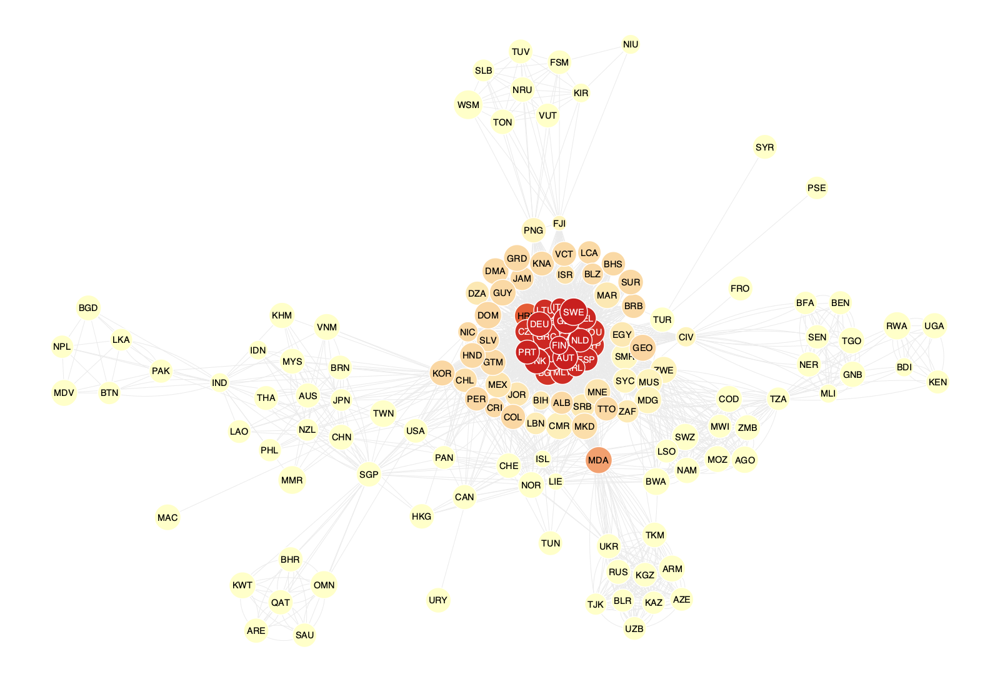

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28432bc10, at 0x29db195b0>

In [629]:
ee, x = gt.eigenvector(sg_yr2, weight=sg_yr2.ep.edge_weight)
gt.graph_draw(sg_yr2, pos=pos_yr2, 
              vertex_fill_color=x,
              vertex_size=12,
              vcmap=color_map,
              vertex_text=sg_yr2.vp.country_name,  
              vertex_font_family='sans serif',
              vertex_color='#FFFFFF',
              vertex_pen_width=0.7,
              edge_pen_width=0.5,
              edge_color='#EBEBEB',
              vorder=x,
              output_size=(800,800))

_**Betweenness centrality**_

Meanwhile, based on the betweenness measure, the role of Asian countries became more prominent after 2000. Singapore is the most central economy, while other Asian countries such as India, Vietnam, China, Papua New Guinea, and Fiji also serve as bridges between clusters. Chile, Jordan, Ukraine and Turkey are also central economies.

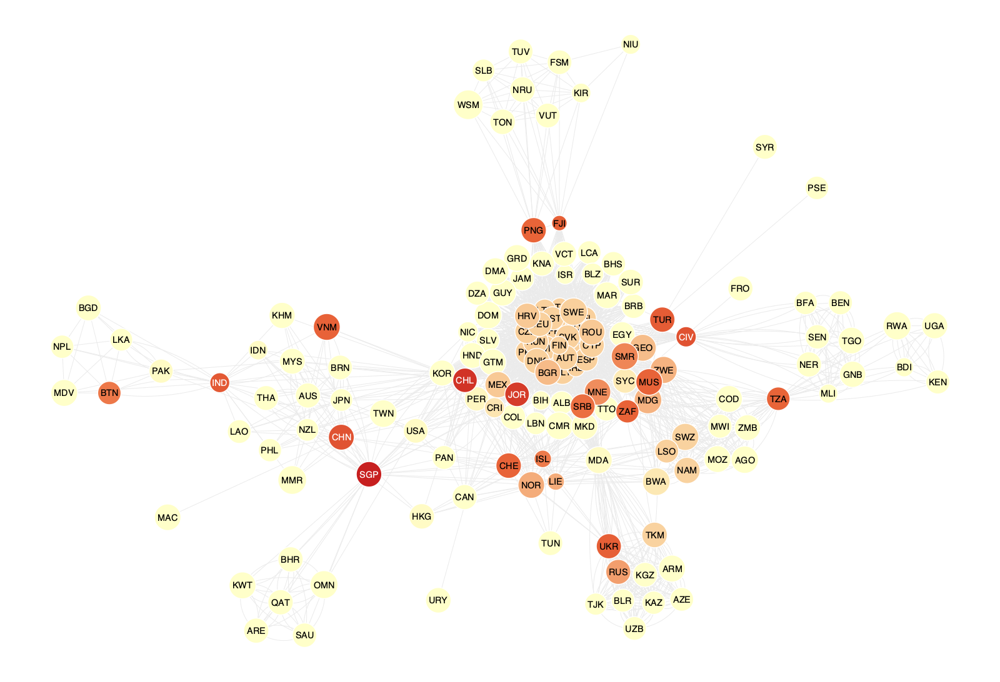

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28432bc10, at 0x28a81f400>

In [630]:
vp, ep = gt.betweenness(sg_yr2, weight=sg_yr2.ep.edge_weight)
gt.graph_draw(sg_yr2, pos=pos_yr2, vertex_fill_color=vp,
              vertex_size=12,
              #edge_pen_width=gt.prop_to_size(ep, mi=0.5, ma=5),
              edge_color='#EBEBEB',
              vcmap=color_map,
              vertex_text=sg_yr2.vp.country_name, 
              vertex_font_family='sans serif',
              vertex_color='#FFFFFF',
              vertex_pen_width=0.7,
              edge_pen_width=0.5,
              vorder=vp,
              output_size=(800,800))

#### ii. Agreements with non-economic provisions

I also examine the centrality measures of the network of agreements that have non-economic provisions. The results show which countries are influential in negotiating PTAs that tackle not only economic integration but also non-tariff issues.

_**Eigenvector centrality**_

As with all other sub-networks, European Union members are also the most central nodes in the non-economic network (based on the eigenvector centrality measure).

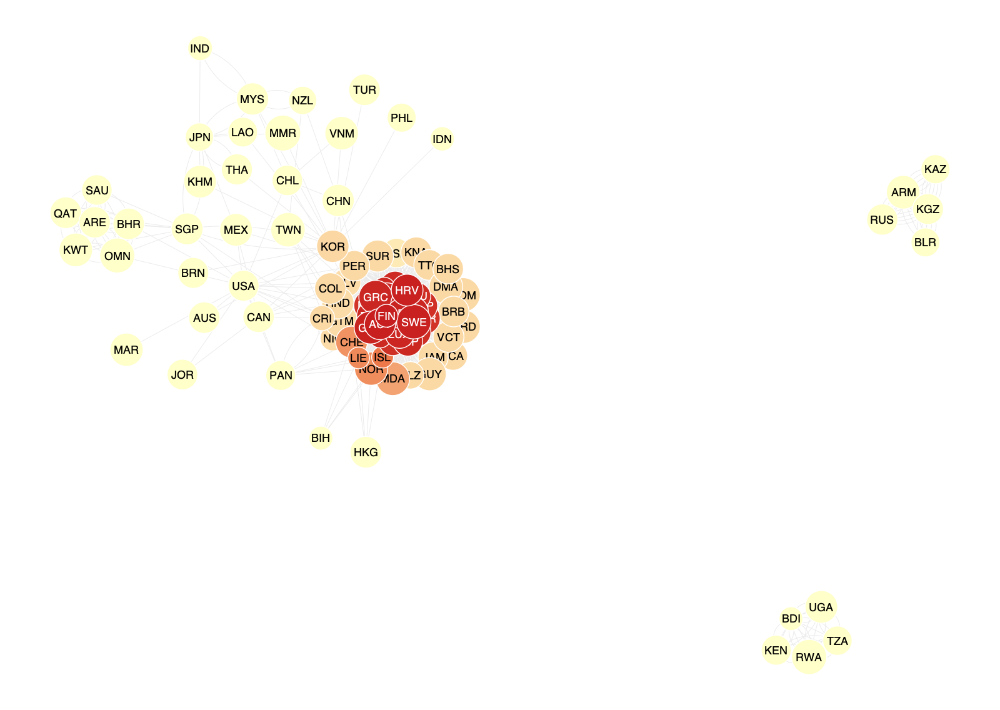

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28a4928e0, at 0x28a801280>

In [647]:
ee, x = gt.eigenvector(sg_nonecon, weight=sg_nonecon.ep.edge_weight)

# network based on centrality
gt.graph_draw(sg_nonecon, pos=pos_scope, 
              vertex_fill_color=x,
              vertex_size=15,
              vcmap=color_map,
              vertex_text=sg_nonecon.vp.country_name,  
              vertex_font_family='sans serif',
              vertex_color='#FFFFFF',
              vertex_pen_width=0.7,
              edge_pen_width=0.5,
              edge_color='#EBEBEB',
              vorder=x,
              output_size=(800,800))

_**Betweenness centrality**_

For betweenness, there are two Asian countries that play significant roles - Korea and Singapore.

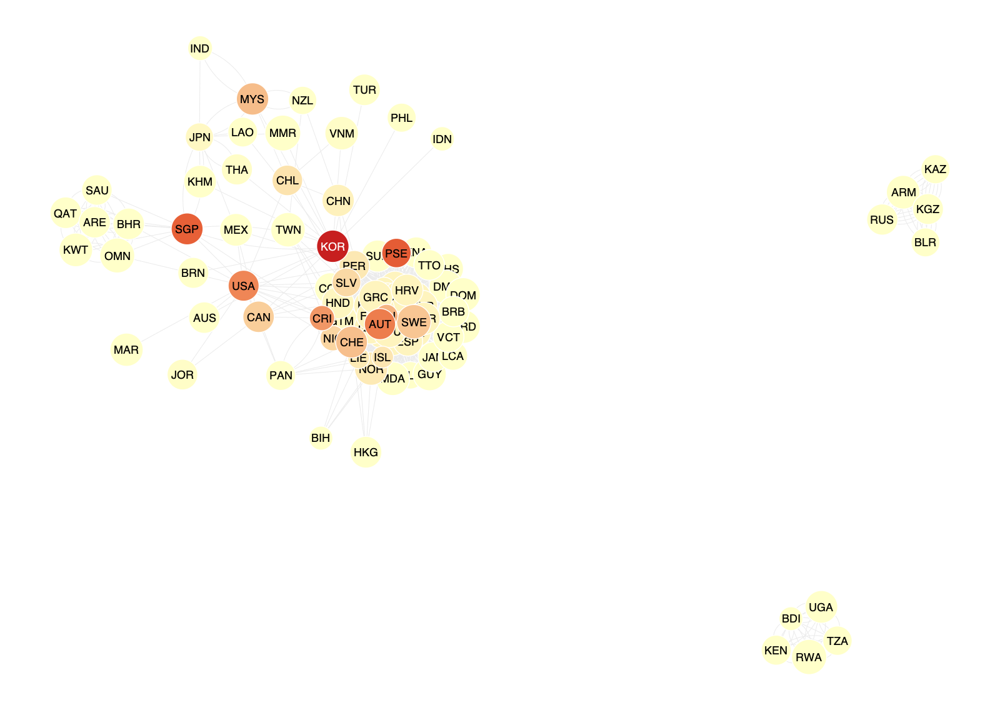

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28a4928e0, at 0x2893bfd90>

In [648]:
vp, ep = gt.betweenness(sg_nonecon, weight=sg_nonecon.ep.edge_weight)
gt.graph_draw(sg_nonecon, pos=pos_scope, vertex_fill_color=vp,
              vertex_size=15,
              #edge_pen_width=gt.prop_to_size(ep, mi=0.5, ma=5),
              edge_color='#EBEBEB',
              vcmap=color_map,
              vertex_text=sg_nonecon.vp.country_name, 
              vertex_font_family='sans serif',
              vertex_color='#FFFFFF',
              vertex_pen_width=0.7,
              edge_pen_width=0.5,
              vorder=vp,
              output_size=(800,800))

### C. Community Detection 

To formally define clusters in the trade agreements network, I apply the Louvain community detection algorithm to the full network and time sub-graphs. While the network plots above show an approximate clustering of nodes by subregion, the Louvain community detection method provides a formal partioning of the graph by maximizing modularity and identifying groups of nodes with more connections to each other compared to nodes in other groups.

In [535]:
def comm_block_model(graph):
    state = gt.minimize_blockmodel_dl(graph)
    membership = state.get_blocks().get_array()
    num_communities = len(set(membership))
    print("Number of communities detected: ", num_communities)
    return state, membership

In [536]:
def print_comms(graph, membership):
    community_ids = np.unique(membership)
    
    for community_id in community_ids:
        community_nodes = np.where(membership == community_id)[0]
        country_names = [graph.vp.country_name[node_id] for node_id in community_nodes]
        print(f"Community {community_id}: {country_names}")

#### i. Full network

In the full network, the model detects 14 communities. The groups are more or less similar to regional clusters, with some notable exceptions. First, non-EU member countries in Europe are defined as one community - Iceland, Liechtenstein, Norway, Switzerland and Turkey. South Asian, East Asian, and South East Asian countries form one large community together with North American partners USA and Canada. The Balkan nations form a separate community where Georgia is included. There is also a diverse community near the center which includes Latin American countries as well as a few economies from Africa, Middle East, and East Asia.

In [543]:
trade_state, trade_mem = comm_block_model(trade_graph)

Number of communities detected:  14


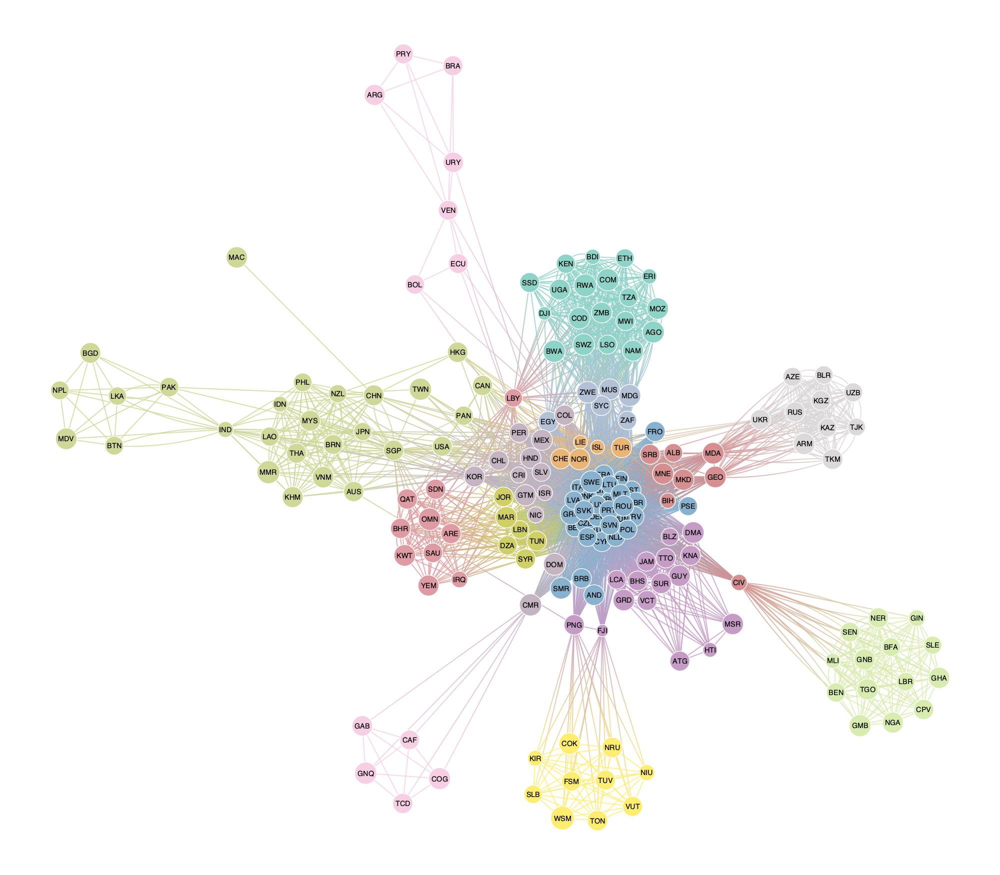

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28aef76d0, at 0x29b6fd310>

In [544]:
trade_state.draw(pos=pos, 
           vertex_size=12, 
           vertex_text=trade_graph.vp.country_name, 
           vertex_font_family='sans serif', 
           vertex_color='#FFFFFF',
           vertex_pen_width=0.7,
           output_size=(1000,1000)
           )

Below is a list of the community assignments of each node.

In [545]:
print_comms(trade_graph, trade_mem)

Community 14: ['EGY', 'MDG', 'MUS', 'SYC', 'ZAF', 'ZWE']
Community 24: ['AGO', 'BDI', 'BWA', 'COD', 'COM', 'DJI', 'ERI', 'ETH', 'KEN', 'LSO', 'MOZ', 'MWI', 'NAM', 'RWA', 'SWZ', 'TZA', 'UGA', 'ZMB', 'SSD']
Community 28: ['ALB', 'BIH', 'MDA', 'MKD', 'MNE', 'SRB', 'GEO', 'CIV']
Community 32: ['AUT', 'BEL', 'BGR', 'CYP', 'CZE', 'DEU', 'DNK', 'ESP', 'EST', 'FIN', 'FRA', 'GBR', 'GRC', 'HRV', 'HUN', 'IRL', 'ITA', 'LTU', 'LUX', 'LVA', 'MLT', 'NLD', 'POL', 'PRT', 'ROU', 'SVK', 'SVN', 'SWE', 'AND', 'BRB', 'FRO', 'PSE', 'SMR']
Community 34: ['ATG', 'BHS', 'BLZ', 'DMA', 'GRD', 'GUY', 'HTI', 'JAM', 'KNA', 'LCA', 'MSR', 'SUR', 'TTO', 'VCT', 'PNG', 'FJI']
Community 48: ['CHL', 'KOR', 'CMR', 'COL', 'CRI', 'DOM', 'GTM', 'HND', 'ISR', 'MEX', 'NIC', 'PER', 'SLV']
Community 55: ['LBY', 'ARE', 'BHR', 'IRQ', 'KWT', 'OMN', 'QAT', 'SAU', 'SDN', 'YEM']
Community 70: ['CHE', 'ISL', 'LIE', 'NOR', 'TUR']
Community 72: ['DZA', 'JOR', 'LBN', 'MAR', 'SYR', 'TUN']
Community 84: ['ARG', 'BRA', 'PRY', 'URY', 'VEN', 'BO

#### ii. Agreements before 2000

The communities detected in the agreements network before 2000 closely follow subregional groupings. Distinctions between the groups are also clearer compared to the full network.

In [616]:
sg1_state, sg1_mem = comm_block_model(sg_yr1)

Number of communities detected:  10


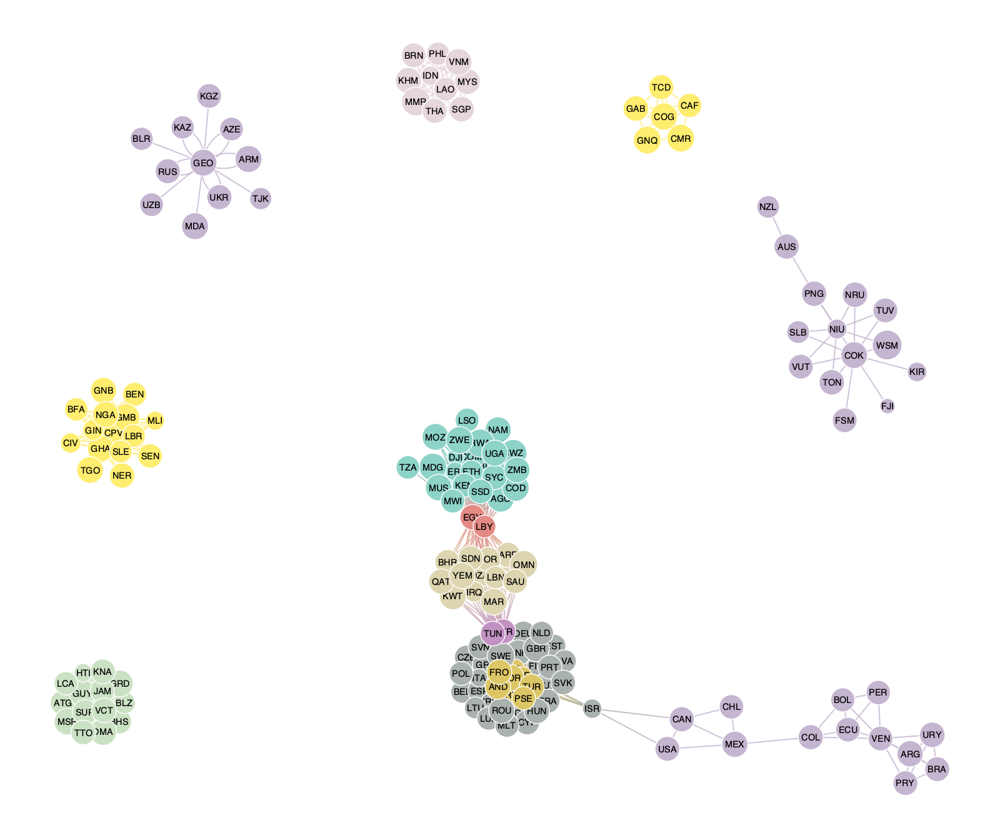

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x2800808e0, at 0x2893bfee0>

In [617]:
sg1_state.draw(pos=pos_yr, 
           vertex_size=12, 
           vertex_text=sg_yr1.vp.country_name, 
           vertex_font_family='sans serif', 
           vertex_color='#FFFFFF',
           vertex_pen_width=0.7,
           output_size=(800,800)
           )

In [618]:
print_comms(sg_yr1, sg1_mem)

Community 6: ['AGO', 'BDI', 'COD', 'COM', 'DJI', 'ERI', 'ETH', 'KEN', 'LSO', 'MDG', 'MOZ', 'MUS', 'MWI', 'NAM', 'RWA', 'SWZ', 'SYC', 'TZA', 'UGA', 'ZMB', 'ZWE', 'SSD']
Community 16: ['EGY', 'LBY']
Community 42: ['CHE', 'HRV', 'ISL', 'LIE', 'NOR', 'TUR', 'AND', 'FRO', 'PSE']
Community 55: ['AUT', 'BEL', 'BGR', 'CYP', 'CZE', 'DEU', 'DNK', 'ESP', 'EST', 'FIN', 'FRA', 'GBR', 'GRC', 'HUN', 'IRL', 'ITA', 'LTU', 'LUX', 'LVA', 'MLT', 'NLD', 'POL', 'PRT', 'ROU', 'SVK', 'SVN', 'SWE', 'ISR']
Community 69: ['ARE', 'BHR', 'DZA', 'IRQ', 'JOR', 'KWT', 'LBN', 'MAR', 'OMN', 'QAT', 'SAU', 'SDN', 'YEM']
Community 84: ['WSM', 'COK', 'FSM', 'KIR', 'MDA', 'NIU', 'NRU', 'SLB', 'ARG', 'BRA', 'PRY', 'URY', 'VEN', 'ARM', 'AZE', 'BLR', 'GEO', 'KAZ', 'KGZ', 'RUS', 'TJK', 'BOL', 'UKR', 'UZB', 'AUS', 'CHL', 'ECU', 'TON', 'NZL', 'PNG', 'USA', 'COL', 'FJI', 'MEX', 'CAN', 'PER', 'TUV', 'VUT']
Community 98: ['ATG', 'BHS', 'BLZ', 'DMA', 'GRD', 'GUY', 'HTI', 'JAM', 'KNA', 'LCA', 'MSR', 'SUR', 'TTO', 'VCT']
Community 114:

#### iii. Agreements after 2000

Communities in the agreements network after 2000 are similar to the full network, with some changes in the grouping of EU economies and NAFTA. 

In [625]:
sg2_state, sg2_mem = comm_block_model(sg_yr2)

Number of communities detected:  14


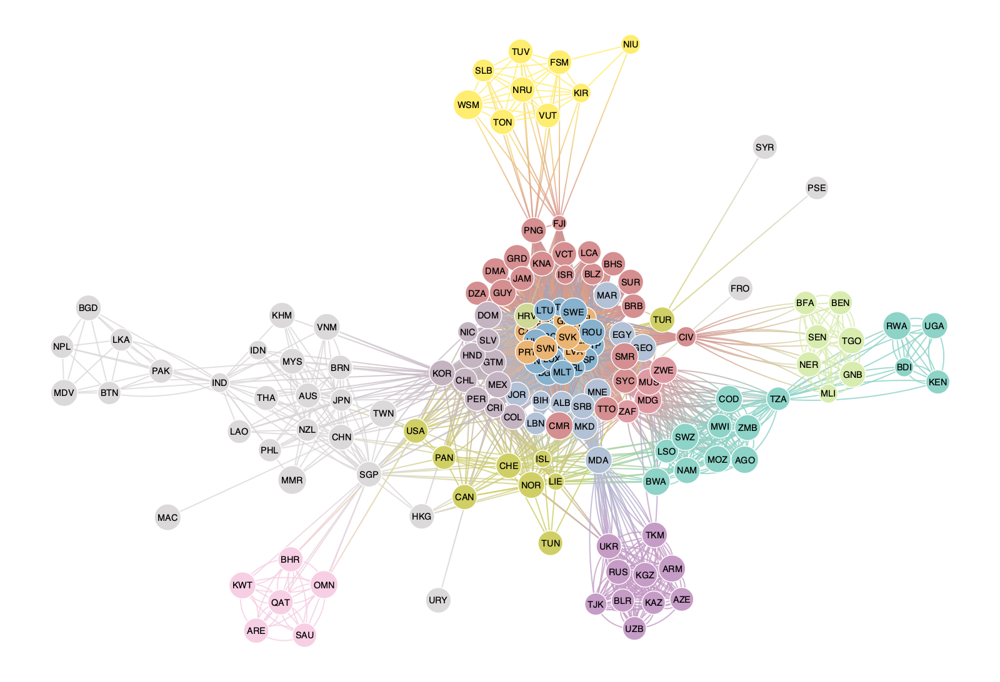

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28432bc10, at 0x29db0a5b0>

In [626]:
sg2_state.draw(pos=pos_yr2, 
           vertex_size=12, 
           vertex_text=sg_yr2.vp.country_name, 
           vertex_font_family='sans serif', 
           vertex_color='#FFFFFF',
           vertex_pen_width=0.7,
           output_size=(800,800)
           )

In [609]:
print_comms(sg_yr2, sg2_mem)

Community 3: ['AGO', 'BDI', 'BWA', 'COD', 'KEN', 'LSO', 'MOZ', 'MWI', 'NAM', 'RWA', 'SWZ', 'TZA', 'UGA', 'ZMB']
Community 16: ['MDG', 'MUS', 'SYC', 'ZAF', 'ZWE']
Community 29: ['CHE', 'ISL', 'LIE', 'NOR', 'TUR', 'PAN', 'TWN']
Community 31: ['EGY', 'ALB', 'BIH', 'MKD', 'MNE', 'SRB', 'JOR', 'LBN', 'TUN', 'CHL', 'KOR', 'COL', 'CRI', 'DOM', 'GTM', 'HND', 'MEX', 'NIC', 'PER', 'SLV', 'CAN']
Community 36: ['DZA', 'MAR', 'GEO', 'BHS', 'BLZ', 'DMA', 'GRD', 'GUY', 'JAM', 'KNA', 'LCA', 'SUR', 'TTO', 'VCT', 'BRB', 'CIV', 'CMR', 'ISR', 'SMR']
Community 53: ['BEL', 'CZE', 'DEU', 'EST', 'GBR', 'LVA', 'NLD', 'POL', 'PRT', 'SVK', 'SVN']
Community 76: ['ARM', 'AZE', 'BLR', 'KAZ', 'KGZ', 'RUS', 'TJK', 'TKM', 'UKR', 'UZB']
Community 77: ['HRV']
Community 103: ['ARE', 'BHR', 'KWT', 'OMN', 'QAT', 'SAU', 'SGP', 'SYR', 'URY', 'AUS', 'BRN', 'IDN', 'JPN', 'KHM', 'LAO', 'MMR', 'MYS', 'NZL', 'PHL', 'THA', 'USA', 'VNM', 'FRO', 'PSE', 'BGD', 'BTN', 'IND', 'LKA', 'MDV', 'NPL', 'PAK', 'CHN', 'HKG', 'MAC']
Community 1

## VI. Conclusion

This report demonstrated how network graphs can be used as tools to analyze the dynamics of preferential trade agreements and intercountry relations. Descriptive measures (clustering, degree, centerality, and communities) provided insights on the structure of the different trade agreement networks, key players, and changes in dynamics over time. Based on the analysis discussed above, it is clear that there have been signficant changes in the nature of preferential trade agreements in the last 30 years. Distinct patterns emerged after the year 2000, with agreements becoming deeper, broader, and more inclusive. Overall, the report highlights how we can use network analysis to gain a more nuanced understanding of how different countries and regions interact in the context of their trade relationships.